In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score,recall_score
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.weightstats import ttest_ind
!pip install scikit-learn seaborn
from sklearn.metrics import confusion_matrix
plt.rcParams['image.cmap'] = "bwr"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from imblearn.over_sampling import SMOTE

In [ ]:
#Carga y descripción general
from google.colab import files
uploaded = files.upload()


Saving earthquake_data_tsunami.csv to earthquake_data_tsunami (1).csv


In [ ]:
df = pd.read_csv('earthquake_data_tsunami.csv')
display(df.head())

,magnitude,cdi,mmi,sig,nst,dmin,gap,depth,latitude,longitude,Year,Month,tsunami
0,7.0,8,7,768,117,0.509,17.0,14.000,-9.7963,159.596,2022,11,1
1,6.9,4,4,735,99,2.229,34.0,25.000,-4.9559,100.738,2022,11,0
2,7.0,3,3,755,147,3.125,18.0,579.000,-20.0508,-178.346,2022,11,1
3,7.3,5,5,833,149,1.865,21.0,37.000,-19.2918,-172.129,2022,11,1
4,6.6,0,2,670,131,4.998,27.0,624.464,-25.5948,178.278,2022,11,1


In [ ]:
#Número de filas y columnas.
#Tipos de variables.
#Información general del conjunto de datos.
print("Dimensiones (filas, columnas):", df.shape)
print("\nTipos de variables:")
print(df.dtypes.head(10))
print("\nInformación general:")
print(df.info())

Dimensiones (filas, columnas): (782, 13)

Tipos de variables:
magnitude    float64
cdi            int64
mmi            int64
sig            int64
nst            int64
dmin         float64
gap          float64
depth        float64
latitude     float64
longitude    float64
dtype: object

Información general:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 782 entries, 0 to 781
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   magnitude  782 non-null    float64
 1   cdi        782 non-null    int64  
 2   mmi        782 non-null    int64  
 3   sig        782 non-null    int64  
 4   nst        782 non-null    int64  
 5   dmin       782 non-null    float64
 6   gap        782 non-null    float64
 7   depth      782 non-null    float64
 8   latitude   782 non-null    float64
 9   longitude  782 non-null    float64
 10  Year       782 non-null    int64  
 11  Month      782 non-null    int64  
 12  tsunami    782 non-nul

In [ ]:
# Listas de columnas numéricas y categóricas (según tipos detectados)
target_col = 'tsunami' # Define target_col as 'tsunami'
numeric_cols = df.select_dtypes(include=['int64','float64']).columns.tolist()
if target_col in numeric_cols:
    numeric_cols.remove(target_col)
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

print("\nColumnas numéricas:", numeric_cols)
print("Columnas categóricas:", categorical_cols)


Columnas numéricas: ['magnitude', 'cdi', 'mmi', 'sig', 'nst', 'dmin', 'gap', 'depth', 'latitude', 'longitude', 'Year', 'Month']
Columnas categóricas: []


In [ ]:
# Limpieza ligera previa: checar nulos y duplicados
print("\nNulos por columna:")
print(df.isnull().sum())
print("\nFilas duplicadas:", df.duplicated().sum())


Nulos por columna:
magnitude    0
cdi          0
mmi          0
sig          0
nst          0
dmin         0
gap          0
depth        0
latitude     0
longitude    0
Year         0
Month        0
tsunami      0
dtype: int64

Filas duplicadas: 0


In [ ]:
# Separar X,y
X = df.drop(columns=[target_col])
y = df[target_col]

In [ ]:
# División estratificada 70/30
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42, stratify=y
)


In [ ]:
print("\nDistribución y (TOTAL):")
print(y.value_counts(normalize=True).rename("proporción"))
print("\nDistribución y (TRAIN):")
print(y_train.value_counts(normalize=True).rename("proporción"))
print("\nDistribución y (TEST):")
print(y_test.value_counts(normalize=True).rename("proporción"))


Distribución y (TOTAL):
tsunami
0    0.611253
1    0.388747
Name: proporción, dtype: float64

Distribución y (TRAIN):
tsunami
0    0.610603
1    0.389397
Name: proporción, dtype: float64

Distribución y (TEST):
tsunami
0    0.612766
1    0.387234
Name: proporción, dtype: float64


In [ ]:
print("\nDistribución y (TOTAL):")
print(y.value_counts(normalize=True).rename("proporción"))
print("\nDistribución y (TRAIN):")
print(y_train.value_counts(normalize=True).rename("proporción"))
print("\nDistribución y (TEST):")
print(y_test.value_counts(normalize=True).rename("proporción"))


Distribución y (TOTAL):
tsunami
0    0.611253
1    0.388747
Name: proporción, dtype: float64

Distribución y (TRAIN):
tsunami
0    0.610603
1    0.389397
Name: proporción, dtype: float64

Distribución y (TEST):
tsunami
0    0.612766
1    0.387234
Name: proporción, dtype: float64



Proporción de clases (%):
tsunami
0    61.12532
1    38.87468
Name: count, dtype: float64


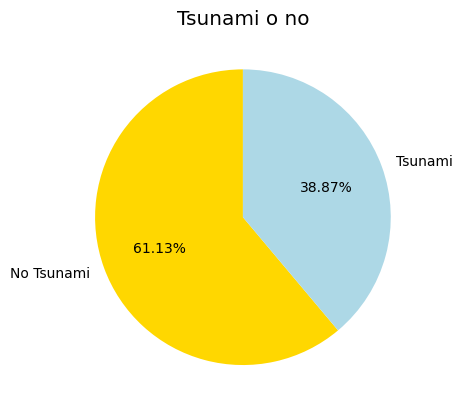

In [ ]:
#Calcula el porcentaje de transacciones fraudulentas (Class=1) y no fraudulentas (Class=0).
#Visualiza la distribución de Class con un gráfico de pastel.
conteo_clase = df['tsunami'].value_counts().sort_index()
porcentajes = conteo_clase / conteo_clase.sum() * 100
print("\nProporción de clases (%):")
print(porcentajes)
COLOR_PIE = ['gold','lightblue'] # Defining COLOR_PIE
plt.pie(conteo_clase, labels=['No Tsunami'
,
'Tsunami'],
autopct='%1.2f%%', startangle=90, colors=COLOR_PIE)
plt.title('Tsunami o no')
plt.show()

Correlación de cada variable con 'tsunami':

tsunami      1.000000
Year         0.647211
dmin         0.400752
cdi          0.160266
gap          0.116360
depth        0.056814
magnitude   -0.004726
sig         -0.015500
Month       -0.022028
latitude    -0.113209
longitude   -0.136778
mmi         -0.147363
nst         -0.600231
Name: tsunami, dtype: float64


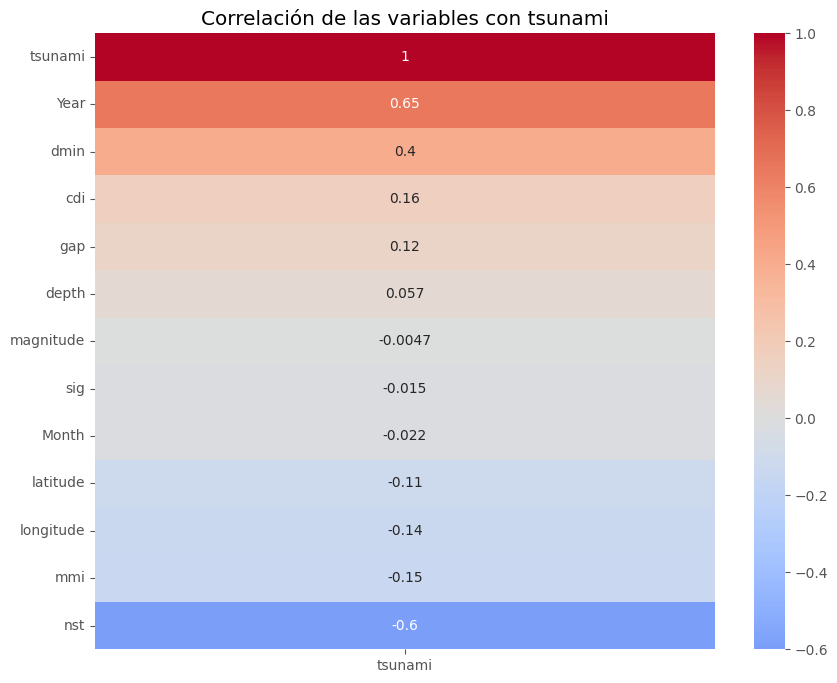

In [ ]:
#Matriz de correlación
# Use the columns from the current dataframe that are relevant for correlation analysis
# Based on the previous analysis, numeric_cols contains all numeric columns except the target
cols_for_corr = numeric_cols + [target_col]

df_corr = df[cols_for_corr]
corr_matrix = df_corr.corr()
corr_with_target = corr_matrix[target_col].sort_values(ascending=False)
print(f"Correlación de cada variable con '{target_col}':\n")
print(corr_with_target)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix[[target_col]].sort_values(by=target_col, ascending=False),
            annot=True, cmap='coolwarm', center=0)
plt.title(f'Correlación de las variables con {target_col}')
plt.show()

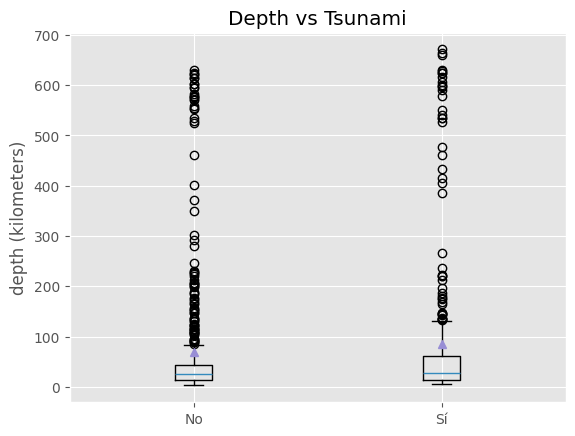

In [ ]:
# Boxplot: depth vs tsunami
depth_no  = df[df[target_col]==0]['depth']
depth_si  = df[df[target_col]==1]['depth']
plt.figure()
plt.boxplot([depth_no, depth_si], labels=['No','Sí'], showmeans=True)
plt.title("Depth vs Tsunami")
plt.ylabel("depth (kilometers)")
plt.show()

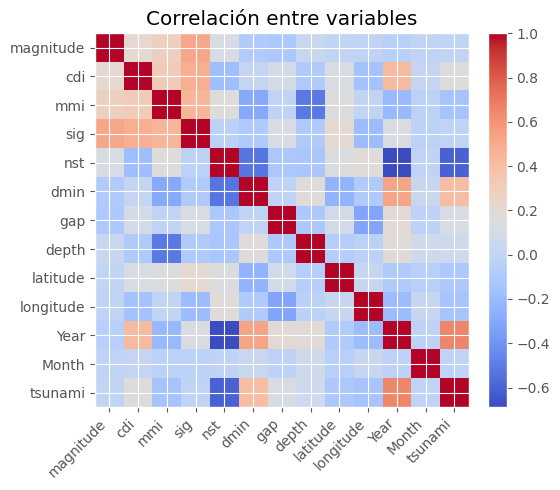

In [ ]:
# Heatmap de correlaciones numéricas
num_df = df[numeric_cols + [target_col]]
corr = num_df.corr()
plt.figure(figsize=(6,5))
plt.imshow(corr, cmap='coolwarm', interpolation='nearest')
plt.xticks(range(len(corr.columns)), corr.columns, rotation=45, ha='right')
plt.yticks(range(len(corr.columns)), corr.columns)
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Correlación entre variables")
plt.tight_layout()
plt.show()

In [ ]:
#Entrenamiento del modelo
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Based on correlation analysis and domain knowledge, selecting some features
# You can adjust this list based on further feature selection or analysis
features = ['Year', 'dmin', 'cdi', 'gap', 'depth', 'latitude', 'longitude', 'mmi', 'nst', 'magnitude']
X = df[features]
y = df[target_col] # Use the target_col defined earlier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
print("Tamaño del conjunto de entrenamiento:", X_train.shape)
print("Tamaño del conjunto de prueba:", X_test.shape)

model = LogisticRegression()
model.fit(X_train, y_train)
coeficientes = pd.DataFrame({'Variable': X.columns, 'Coeficientes': model.coef_[0]})
display(coeficientes)

Tamaño del conjunto de entrenamiento: (547, 10)
Tamaño del conjunto de prueba: (235, 10)


,Variable,Coeficientes
0,Year,0.000449
1,dmin,0.064501
2,cdi,0.097445
3,gap,0.004813
4,depth,-0.001513
5,latitude,-0.008390
6,longitude,-0.000545
7,mmi,-0.222459
8,nst,-0.007934
9,magnitude,0.096939


In [ ]:
#Evaluación e interpretación
from sklearn.metrics import confusion_matrix, classification_report
y_pred = model.predict(X_test)
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matriz de confusión:")
display(conf_matrix)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

Matriz de confusión:


array([[109,  35],
       [ 13,  78]])

              precision    recall  f1-score   support

           0       0.89      0.76      0.82       144
           1       0.69      0.86      0.76        91

    accuracy                           0.80       235
   macro avg       0.79      0.81      0.79       235
weighted avg       0.81      0.80      0.80       235



AUC: 0.8350885225885226


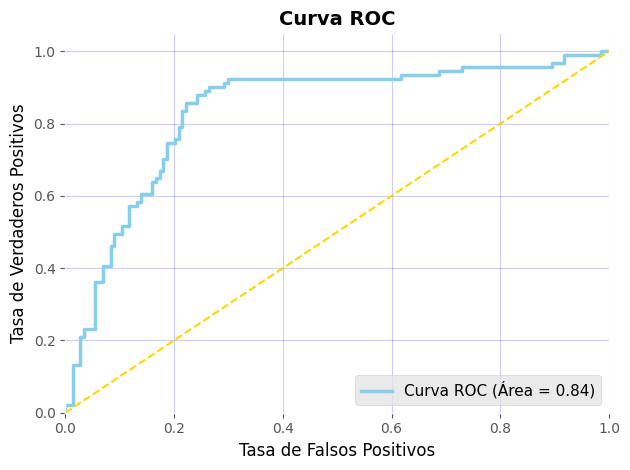

In [ ]:
#Curva ROC Y AUC
from sklearn.metrics import roc_auc_score, roc_curve, auc

y_pred_prob = model.predict_proba(X_test)[:, 1]

auc_score = roc_auc_score(y_test, y_pred_prob)
print("AUC:", auc_score)

fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='skyblue', lw=2.5, label=f'Curva ROC (Área = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gold', lw=1.5, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos', fontsize=12, color='black')
plt.ylabel('Tasa de Verdaderos Positivos', fontsize=12, color='black')
plt.title('Curva ROC', fontsize=14, fontweight='bold')
plt.legend(loc='lower right', fontsize=11)

plt.grid(True, linestyle='-', alpha=0.2, color='blue')
plt.gca().set_facecolor('white')

plt.tight_layout()
plt.show()

Matriz de Confusión:
Predicción    0   1
Real               
0           109  35
1            13  78


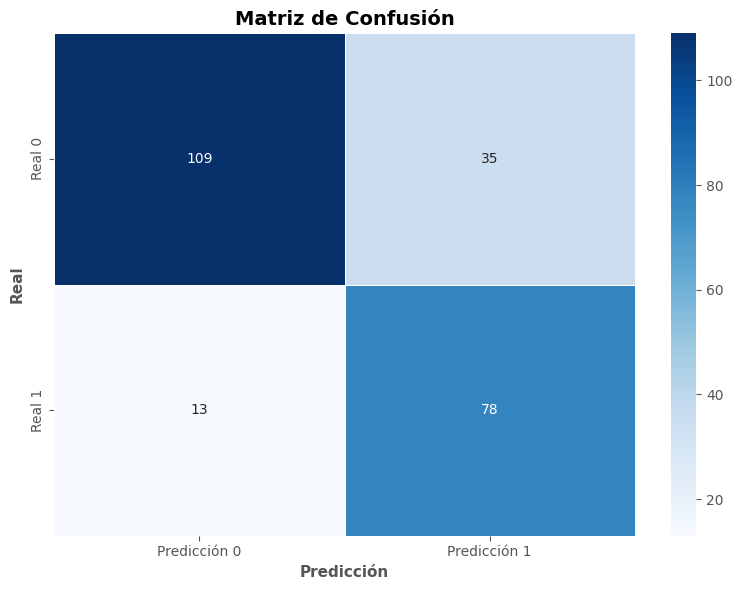

In [ ]:
#Gráfico matriz de confusión
confusion_matrix = pd.crosstab(
    y_test,
    y_pred,
    rownames=['Real'],
    colnames=['Predicción']
)

print("Matriz de Confusión:")
print(confusion_matrix)
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    linewidths=0.5,
    linecolor='white',
    xticklabels=['Predicción 0', 'Predicción 1'],
    yticklabels=['Real 0', 'Real 1']
)

plt.xlabel('Predicción', fontsize=11, fontweight='bold')
plt.ylabel('Real', fontsize=11, fontweight='bold')
plt.title('Matriz de Confusión', fontsize=14, fontweight='bold')

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
!pip install ydata-profiling

In [ ]:
from ydata_profiling import ProfileReport

report = ProfileReport(df, title="Profiling Report")
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 32.51it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]